#### B_18 Dönem Projesi Atmosferik ve Turbo Motorların Egzoz seslerinin Analizi
#### Özgür Berke Çağlak - Merve Uzuner - Batuhan Pamukçu

# TASARLANAN FİLTRE

IIR alçak geçiren Butterworth filtresi tasarlandı.

Text(0.5, 1.0, 'IIR Lowpass Butterworth Grup Gecikmesi Grafiği')

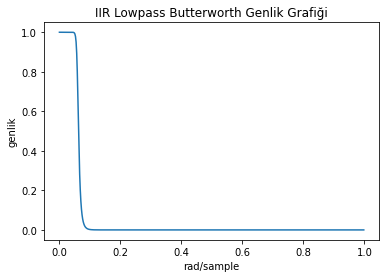

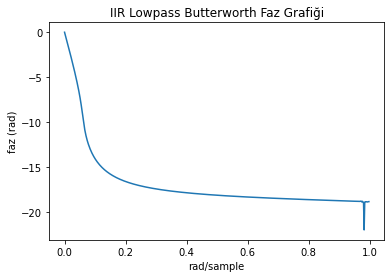

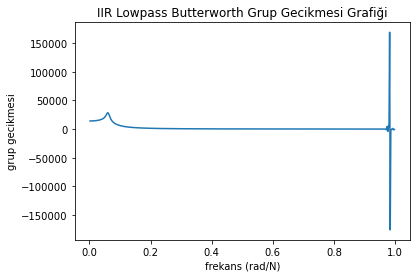

In [9]:
import numpy as np 
import matplotlib.pyplot as plt 
import scipy.signal as sgnl
from scipy.fftpack import fft, ifft
from scipy.io import loadmat

%matplotlib inline

#filtre katsayılarını alma
filter_data = loadmat('B18_LowpassButterworthIIR.mat') # Filtre yüklenmesi
Coeffs = filter_data['ba'].astype(np.float) # katsayılar için tip belirleme
b = Coeffs[0,:] # b katsayıları
a = Coeffs[1,:] # a katsayıları

w, Hw = sgnl.freqz(b,a)

Hw_mag = abs(Hw)
Hw_phs = np.unwrap(np.angle(Hw))

#genlik
plt.figure()
plt.plot(w/np.pi, Hw_mag)
plt.ylabel('genlik')
plt.xlabel('rad/sample')
plt.title("IIR Lowpass Butterworth Genlik Grafiği")

#faz
plt.figure()
plt.plot(w/np.pi, Hw_phs)
plt.ylabel('faz (rad)')
plt.xlabel('rad/sample')
plt.title("IIR Lowpass Butterworth Faz Grafiği")

#grup gecikmesi
tau_w = -np.diff(Hw_phs)*(N/(2*np.pi))

plt.figure()
plt.plot(w[1::]/np.pi, tau_w)
plt.xlabel('frekans (rad/N)')
plt.ylabel('grup gecikmesi')
plt.title("IIR Lowpass Butterworth Grup Gecikmesi Grafiği")

# PORSCHE

#### TURBO

<ipython-input-1-016532792cdf>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, x = read("B18_PorscheTurbo.wav")


(356549, 2)
44100
Porsche turbo motorun genlik parametreleri toplamı : 190058.50600317126


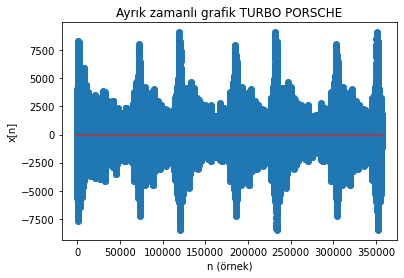

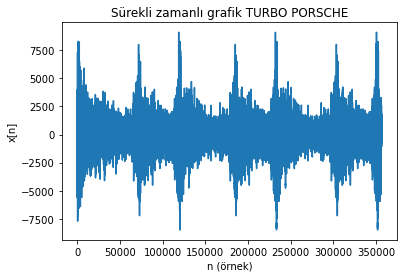

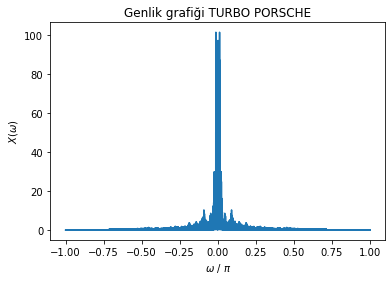

x[n] işareti için:


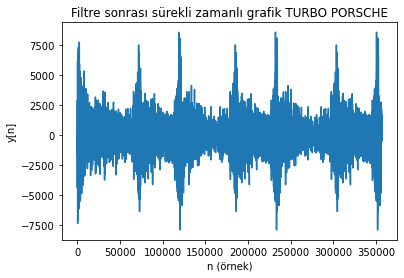

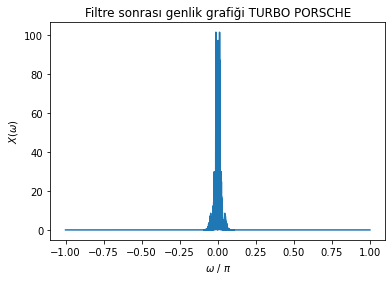

y[n] işareti için:


Filtre sonrası Porsche turbo motorun genlik parametreleri toplamı : 107509.01225350749


In [1]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio

Fs, x = read("B18_PorscheTurbo.wav")
print(x.shape) # x'in boyut bilgisi
print(Fs)
xn = x[:,1] # x'in 1. kanal örnekleri
N = len(x)
n=np.arange(0,N) # örnekleme indisinin array şeklinde tanımlanması

# Fourier dönüşümü ve frekans domaininde inceleme
w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
xw = np.fft.fftshift(np.fft.fft(xn,N)/N) # işaretin Fourier transformu

x_gen = abs(xw) #işaretin genliği

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t1 = sum(x_gen)

print('Porsche turbo motorun genlik parametreleri toplamı :',t1)

# Xn ayrık zamanlı işaretinin ayrık şekilde çizdirilmesi
plt.figure()
plt.stem(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Ayrık zamanlı grafik TURBO PORSCHE")

# Xn ayrık zamanlı işaretinin sürekli şekilde çizdirilmesi
plt.figure()
plt.plot(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Sürekli zamanlı grafik TURBO PORSCHE")

# Frekans domaininde yer alan Xw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(xw)) # X(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Genlik grafiği TURBO PORSCHE")
plt.show()

# ham ses dosyasının arayüzde oynatılması
print('x[n] işareti için:')
display(Audio(xn, rate=Fs))

# ham ses dosyasının tasarlanan filtreden geçirilmesi
filter_data = loadmat('projeButterworthIIR.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0,:] # filtre katsayıları
a = Coeffs[1,:]

yn = sgnl.lfilter(b, a, xn) # filtre sonrası elde edilen ses işareti

plt.figure()
plt.plot(n,yn) # y[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y[n]") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası sürekli zamanlı grafik TURBO PORSCHE")

# Elde edilen Yn işaretinin frekans domainine geçirilmesi
yw = np.fft.fftshift(np.fft.fft(yn,N)/N) # işaretin Fourier transformu

y_gen = abs(yw) # işaretin genliği

# Frekans domaininde yer alan Yw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(yw)) # Y(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası genlik grafiği TURBO PORSCHE")
plt.show()

# filtreden geçirilmiş ses dosyasının arayüzde oynatılması
print('y[n] işareti için:')
display(Audio(yn, rate=Fs))

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t1f = sum(y_gen)

print('Filtre sonrası Porsche turbo motorun genlik parametreleri toplamı :',t1f)

#### ATMOSFERİK

(353546, 2)
44100


<ipython-input-2-5a4ad6b1c4e9>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, x = read("B18_PorscheAtmosferik.wav")


Porsche atmosferik motorun genlik parametreleri toplamı : 574872.1337173951


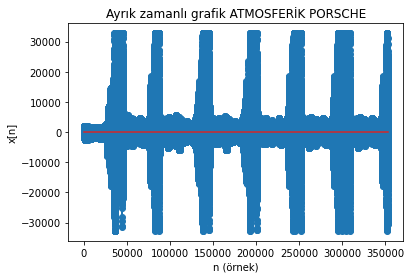

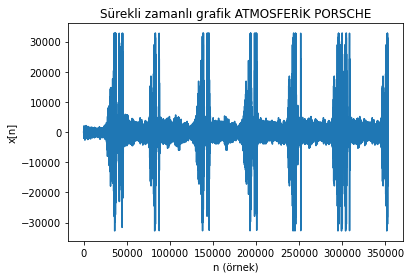

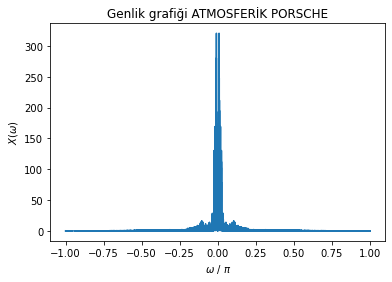

x[n] işareti için:


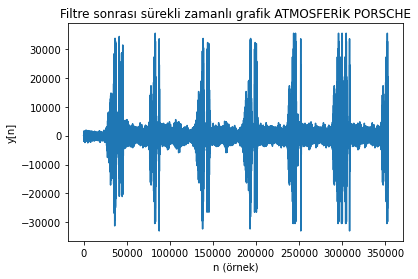

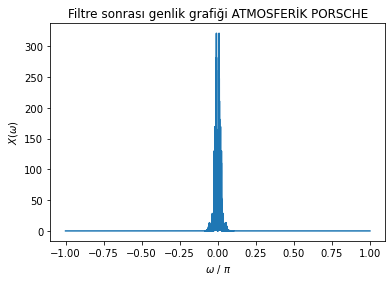

y[n] işareti için:


Filtre sonrası Porsche atmosferik motorun genlik parametreleri toplamı : 405632.3164146894


In [2]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio

Fs, x = read("B18_PorscheAtmosferik.wav")
print(x.shape) # x'in boyut bilgisi
print(Fs)
xn = x[:,1] # x'in 1. kanal örnekleri
N = len(x)
n=np.arange(0,N) # örnekleme indisinin array şeklinde tanımlanması

# Fourier dönüşümü ve frekans domaininde inceleme
w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
xw = np.fft.fftshift(np.fft.fft(xn,N)/N) # işaretin Fourier transformu

x_gen = abs(xw) #işaretin genliği

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t2 = sum(x_gen)

print('Porsche atmosferik motorun genlik parametreleri toplamı :',t2)

# Xn ayrık zamanlı işaretinin ayrık şekilde çizdirilmesi
plt.figure()
plt.stem(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Ayrık zamanlı grafik ATMOSFERİK PORSCHE")

# Xn ayrık zamanlı işaretinin sürekli şekilde çizdirilmesi
plt.figure()
plt.plot(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Sürekli zamanlı grafik ATMOSFERİK PORSCHE")

# Frekans domaininde yer alan Xw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(xw)) # X(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Genlik grafiği ATMOSFERİK PORSCHE")
plt.show()

# ham ses dosyasının arayüzde oynatılması
print('x[n] işareti için:')
display(Audio(xn, rate=Fs))

# ham ses dosyasının tasarlanan filtreden geçirilmesi
filter_data = loadmat('projeButterworthIIR.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0] # filtre katsayıları
a = Coeffs[1]

yn = sgnl.lfilter(b, a, xn) # filtre sonrası elde edilen ses işareti

plt.figure()
plt.plot(n,yn) # y[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y[n]") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası sürekli zamanlı grafik ATMOSFERİK PORSCHE")

# Elde edilen Yn işaretinin frekans domainine geçirilmesi
yw = np.fft.fftshift(np.fft.fft(yn,N)/N) # işaretin Fourier transformu

y_gen = abs(yw) # işaretin genliği

# Frekans domaininde yer alan Yw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(yw)) # Y(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası genlik grafiği ATMOSFERİK PORSCHE")
plt.show()

# filtreden geçirilmiş ses dosyasının arayüzde oynatılması
print('y[n] işareti için:')
display(Audio(yn, rate=Fs))

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t2f = sum(y_gen)

print('Filtre sonrası Porsche atmosferik motorun genlik parametreleri toplamı :',t2f)

# MERCEDES

#### TURBO 1

<ipython-input-3-1023e31a707f>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, x = read("B18_MercedesTurbo01.wav")


(358233, 2)
44100
Mercedes turbo motorun genlik parametreleri toplamı : 137080.67866711054


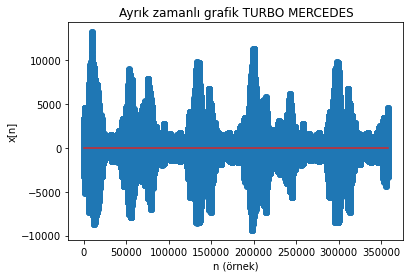

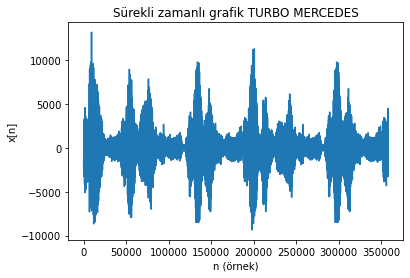

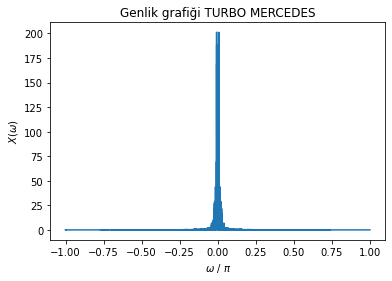

x[n] işareti için:


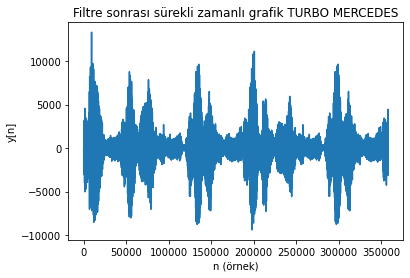

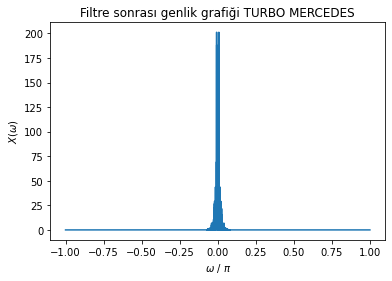

y[n] işareti için:


Filtre sonrası Mercedes turbo motorun genlik parametreleri toplamı : 123296.11044441468


In [3]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio

Fs, x = read("B18_MercedesTurbo01.wav")
print(x.shape) # x'in boyut bilgisi
print(Fs)
xn = x[:,1] # x'in 1. kanal örnekleri
N = len(x)
n=np.arange(0,N) # örnekleme indisinin array şeklinde tanımlanması

# Fourier dönüşümü ve frekans domaininde inceleme
w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
xw = np.fft.fftshift(np.fft.fft(xn,N)/N) # işaretin Fourier transformu

x_gen = abs(xw) #işaretin genliği

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t3 = sum(x_gen)

print('Mercedes turbo motorun genlik parametreleri toplamı :',t3)

# Xn ayrık zamanlı işaretinin ayrık şekilde çizdirilmesi
plt.figure()
plt.stem(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Ayrık zamanlı grafik TURBO MERCEDES")

# Xn ayrık zamanlı işaretinin sürekli şekilde çizdirilmesi
plt.figure()
plt.plot(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Sürekli zamanlı grafik TURBO MERCEDES")

# Frekans domaininde yer alan Xw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(xw)) # X(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Genlik grafiği TURBO MERCEDES")
plt.show()

# ham ses dosyasının arayüzde oynatılması
print('x[n] işareti için:')
display(Audio(xn, rate=Fs))

# ham ses dosyasının tasarlanan filtreden geçirilmesi
filter_data = loadmat('projeButterworthIIR.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0,:] # filtre katsayıları
a = Coeffs[1,:]

yn = sgnl.lfilter(b, a, xn) # filtre sonrası elde edilen ses işareti

plt.figure()
plt.plot(n,yn) # y[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y[n]") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası sürekli zamanlı grafik TURBO MERCEDES")

# Elde edilen Yn işaretinin frekans domainine geçirilmesi
yw = np.fft.fftshift(np.fft.fft(yn,N)/N) # işaretin Fourier transformu

y_gen = abs(yw) # işaretin genliği

# Frekans domaininde yer alan Yw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(yw)) # Y(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası genlik grafiği TURBO MERCEDES")
plt.show()

# filtreden geçirilmiş ses dosyasının arayüzde oynatılması
print('y[n] işareti için:')
display(Audio(yn, rate=Fs))

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t3f = sum(y_gen)

print('Filtre sonrası Mercedes turbo motorun genlik parametreleri toplamı :',t3f)

#### ATMOSFERİK 1

<ipython-input-4-eb59c0d3e192>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, x = read("B18_MercedesAtmosferik01.wav")


(359377, 2)
44100
Mercedes atmosferik motorun genlik parametreleri toplamı : 1281994.3660478047


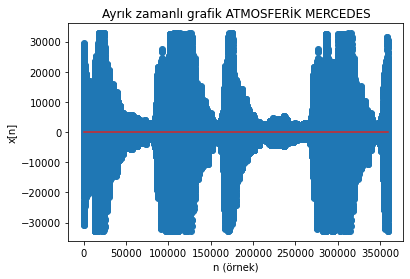

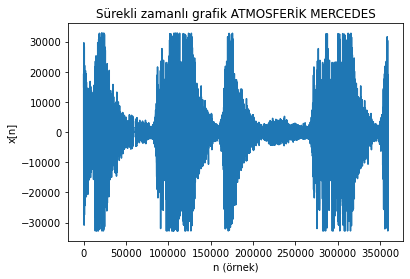

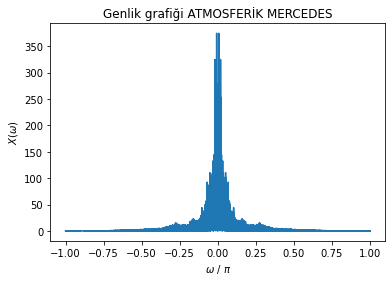

x[n] işareti için:


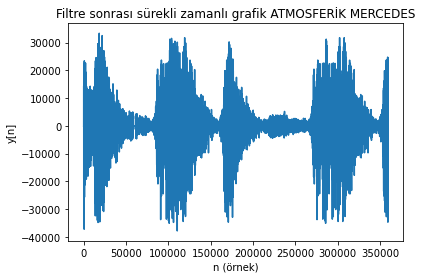

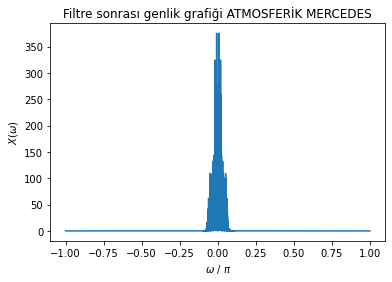

y[n] işareti için:


Filtre sonrası Mercedes atmosferik motorun genlik parametreleri toplamı : 728603.6436244239


In [4]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio

Fs, x = read("B18_MercedesAtmosferik01.wav")
print(x.shape) # x'in boyut bilgisi
print(Fs)
xn = x[:,1] # x'in 1. kanal örnekleri
N = len(x)
n=np.arange(0,N) # örnekleme indisinin array şeklinde tanımlanması

# Fourier dönüşümü ve frekans domaininde inceleme
w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
xw = np.fft.fftshift(np.fft.fft(xn,N)/N) # işaretin Fourier transformu

x_gen = abs(xw) #işaretin genliği

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t4 = sum(x_gen)

print('Mercedes atmosferik motorun genlik parametreleri toplamı :',t4)

# Xn ayrık zamanlı işaretinin ayrık şekilde çizdirilmesi
plt.figure()
plt.stem(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Ayrık zamanlı grafik ATMOSFERİK MERCEDES")

# Xn ayrık zamanlı işaretinin sürekli şekilde çizdirilmesi
plt.figure()
plt.plot(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Sürekli zamanlı grafik ATMOSFERİK MERCEDES")

# Frekans domaininde yer alan Xw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(xw)) # X(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Genlik grafiği ATMOSFERİK MERCEDES")
plt.show()

# ham ses dosyasının arayüzde oynatılması
print('x[n] işareti için:')
display(Audio(xn, rate=Fs))

# ham ses dosyasının tasarlanan filtreden geçirilmesi
filter_data = loadmat('projeButterworthIIR.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0,:] # filtre katsayıları
a = Coeffs[1,:]

yn = sgnl.lfilter(b, a, xn) # filtre sonrası elde edilen ses işareti

plt.figure()
plt.plot(n,yn) # y[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y[n]") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası sürekli zamanlı grafik ATMOSFERİK MERCEDES")

# Elde edilen Yn işaretinin frekans domainine geçirilmesi
yw = np.fft.fftshift(np.fft.fft(yn,N)/N) # işaretin Fourier transformu

y_gen = abs(yw) # işaretin genliği

# Frekans domaininde yer alan Yw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(yw)) # Y(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası genlik grafiği ATMOSFERİK MERCEDES")
plt.show()

# filtreden geçirilmiş ses dosyasının arayüzde oynatılması
print('y[n] işareti için:')
display(Audio(yn, rate=Fs))

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t4f = sum(y_gen)

print('Filtre sonrası Mercedes atmosferik motorun genlik parametreleri toplamı :',t4f)

#### TURBO 2

<ipython-input-6-9282de56f0a8>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, x = read("B18_MercedesTurbo02.wav")


(357183, 2)
44100
Mercedes a45s turbo motorun genlik parametreleri toplamı : 287212.8928811866


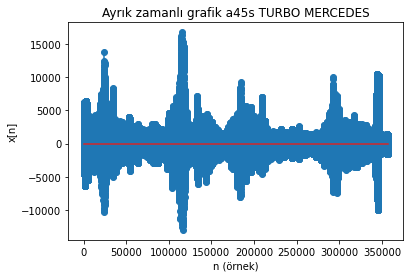

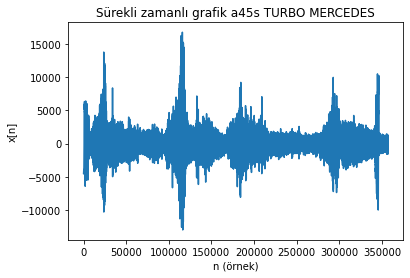

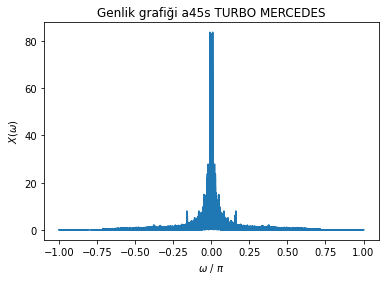

x[n] işareti için:


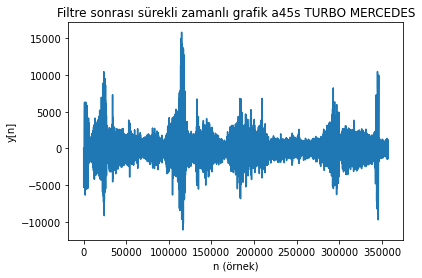

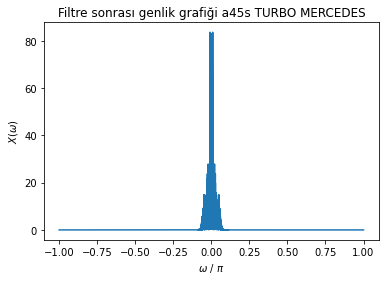

y[n] işareti için:


Filtre sonrası Mercedes a45s turbo motorun genlik parametreleri toplamı : 158561.67190083215


In [6]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio

Fs, x = read("B18_MercedesTurbo02.wav")
print(x.shape) # x'in boyut bilgisi
print(Fs)
xn = x[:,1] # x'in 1. kanal örnekleri
N = len(x)
n=np.arange(0,N) # örnekleme indisinin array şeklinde tanımlanması

# Fourier dönüşümü ve frekans domaininde inceleme
w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
xw = np.fft.fftshift(np.fft.fft(xn,N)/N) # işaretin Fourier transformu

x_gen = abs(xw) #işaretin genliği

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t5 = sum(x_gen)

print('Mercedes a45s turbo motorun genlik parametreleri toplamı :',t5)

# Xn ayrık zamanlı işaretinin ayrık şekilde çizdirilmesi
plt.figure()
plt.stem(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Ayrık zamanlı grafik a45s TURBO MERCEDES")

# Xn ayrık zamanlı işaretinin sürekli şekilde çizdirilmesi
plt.figure()
plt.plot(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Sürekli zamanlı grafik a45s TURBO MERCEDES")

# Frekans domaininde yer alan Xw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(xw)) # X(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Genlik grafiği a45s TURBO MERCEDES")
plt.show()

# ham ses dosyasının arayüzde oynatılması
print('x[n] işareti için:')
display(Audio(xn, rate=Fs))

# ham ses dosyasının tasarlanan filtreden geçirilmesi
filter_data = loadmat('projeButterworthIIR.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0,:] # filtre katsayıları
a = Coeffs[1,:]

yn = sgnl.lfilter(b, a, xn) # filtre sonrası elde edilen ses işareti

plt.figure()
plt.plot(n,yn) # y[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y[n]") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası sürekli zamanlı grafik a45s TURBO MERCEDES")

# Elde edilen Yn işaretinin frekans domainine geçirilmesi
yw = np.fft.fftshift(np.fft.fft(yn,N)/N) # işaretin Fourier transformu

y_gen = abs(yw) # işaretin genliği

# Frekans domaininde yer alan Yw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(yw)) # Y(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası genlik grafiği a45s TURBO MERCEDES")
plt.show()

# filtreden geçirilmiş ses dosyasının arayüzde oynatılması
print('y[n] işareti için:')
display(Audio(yn, rate=Fs))

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t5f = sum(y_gen)

print('Filtre sonrası Mercedes a45s turbo motorun genlik parametreleri toplamı :',t5f)

#### ATMOSFERİK 2

<ipython-input-5-9a6d86fcb75a>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, x = read("B18_MercedesAtmosferik02.wav")


(362149, 2)
44100
Mercedes sls amg atmosferik motorun genlik parametreleri toplamı : 1702025.905078921


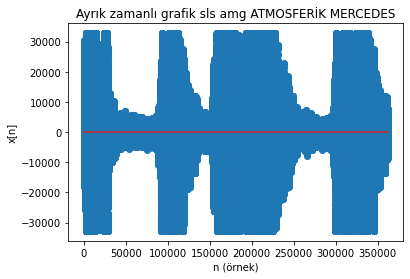

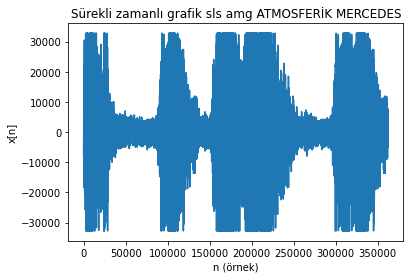

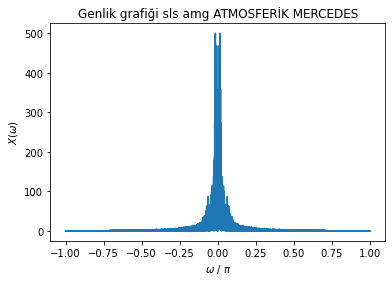

x[n] işareti için:


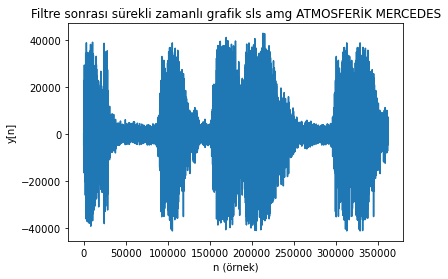

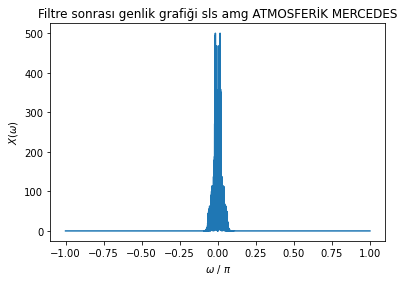

y[n] işareti için:


Filtre sonrası Mercedes sls amg atmosferik motorun genlik parametreleri toplamı : 1121773.1608061178


In [5]:
import matplotlib.pyplot as plt # grafik çizimi için gerekli kütüphanenin aktifleştirilmesi
import numpy as np
import scipy.signal as sgnl

from scipy.io.wavfile import read # Ses dosyasının okunması için gerekli kütüphane
from scipy.io import loadmat
from IPython.lib.display import Audio

Fs, x = read("B18_MercedesAtmosferik02.wav")
print(x.shape) # x'in boyut bilgisi
print(Fs)
xn = x[:,1] # x'in 1. kanal örnekleri
N = len(x)
n=np.arange(0,N) # örnekleme indisinin array şeklinde tanımlanması

# Fourier dönüşümü ve frekans domaininde inceleme
w = np.arange(-np.pi, np.pi, 2*np.pi/N) # omega ekseninin tanımlanması
xw = np.fft.fftshift(np.fft.fft(xn,N)/N) # işaretin Fourier transformu

x_gen = abs(xw) #işaretin genliği

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t6 = sum(x_gen)

print('Mercedes sls amg atmosferik motorun genlik parametreleri toplamı :',t6)

# Xn ayrık zamanlı işaretinin ayrık şekilde çizdirilmesi
plt.figure()
plt.stem(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Ayrık zamanlı grafik sls amg ATMOSFERİK MERCEDES")

# Xn ayrık zamanlı işaretinin sürekli şekilde çizdirilmesi
plt.figure()
plt.plot(n,xn) # x[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("x[n]") # y ekseninin isimlendirilmesi
plt.title("Sürekli zamanlı grafik sls amg ATMOSFERİK MERCEDES")

# Frekans domaininde yer alan Xw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(xw)) # X(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Genlik grafiği sls amg ATMOSFERİK MERCEDES")
plt.show()

# ham ses dosyasının arayüzde oynatılması
print('x[n] işareti için:')
display(Audio(xn, rate=Fs))

# ham ses dosyasının tasarlanan filtreden geçirilmesi
filter_data = loadmat('projeButterworthIIR.mat')
Coeffs = filter_data['ba'].astype(np.float)   

b = Coeffs[0,:] # filtre katsayıları
a = Coeffs[1,:]

yn = sgnl.lfilter(b, a, xn) # filtre sonrası elde edilen ses işareti

plt.figure()
plt.plot(n,yn) # y[n] işaretinin grafiğinin çizdirilmesi
plt.xlabel("n (örnek)") # x ekseninin isimlendirilmesi
plt.ylabel("y[n]") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası sürekli zamanlı grafik sls amg ATMOSFERİK MERCEDES")

# Elde edilen Yn işaretinin frekans domainine geçirilmesi
yw = np.fft.fftshift(np.fft.fft(yn,N)/N) # işaretin Fourier transformu

y_gen = abs(yw) # işaretin genliği

# Frekans domaininde yer alan Yw işaretinin genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(w/np.pi,abs(yw)) # Y(w) işaretinin grafiğinin çizdirilmesi
plt.xlabel("$\omega$ / $\pi$") # x ekseninin isimlendirilmesi
plt.ylabel("$X(\omega)$") # y ekseninin isimlendirilmesi
plt.title("Filtre sonrası genlik grafiği sls amg ATMOSFERİK MERCEDES")
plt.show()

# filtreden geçirilmiş ses dosyasının arayüzde oynatılması
print('y[n] işareti için:')
display(Audio(yn, rate=Fs))

# Seslerin birbirinden ayrılabilmesi icin genlik parametrelerinin toplamı
t6f = sum(y_gen)

print('Filtre sonrası Mercedes sls amg atmosferik motorun genlik parametreleri toplamı :',t6f)

# Seslerin Karşılaştırılması

In [7]:
motorsesi = np.array([t1f, t2f, t3f, t4f, t5f, t6f])
print(motorsesi)

[ 107509.01225351  405632.31641469  123296.11044441  728603.64362442
  158561.67190083 1121773.16080612]


In [8]:
i = 0
for i in range (0, 6):
    if motorsesi[i] > 280000:
        print('t', i+1, 'f =', motorsesi[i], 'genlik toplamı parametresine sahip motor ATMOSFERİK motordur.')
    else:
        print('t', i+1, 'f =', motorsesi[i], 'genlik toplamı parametresine sahip motor TURBO motordur.')


t 1 f = 107509.01225350749 genlik toplamı parametresine sahip motor TURBO motordur.
t 2 f = 405632.3164146894 genlik toplamı parametresine sahip motor ATMOSFERİK motordur.
t 3 f = 123296.11044441468 genlik toplamı parametresine sahip motor TURBO motordur.
t 4 f = 728603.6436244239 genlik toplamı parametresine sahip motor ATMOSFERİK motordur.
t 5 f = 158561.67190083215 genlik toplamı parametresine sahip motor TURBO motordur.
t 6 f = 1121773.1608061178 genlik toplamı parametresine sahip motor ATMOSFERİK motordur.
